# Quality Control, Batch Integration, Dimensionality Reduction, and Clustering
### Adata objects have already undergone doublet detection (scDblFinder) and ambient RNA removal (SoupX)

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import scvi
import warnings
from scipy.stats import median_abs_deviation as mad

sc.set_figure_params(scanpy=True, dpi=80, dpi_save=150, frameon=True, vector_friendly=True, 
                     fontsize=14, figsize=None, color_map=None, format='png', facecolor=None, 
                     transparent=False, ipython_format='png2x')

/mnt/home/terrianl/anaconda3/envs/scanpyEnv/lib/python3.11/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/mnt/home/terrianl/anaconda3/envs/scanpyEnv/lib/python3.11/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (


In [2]:
warnings.simplefilter("ignore", FutureWarning)
warnings.simplefilter("ignore", UserWarning)
warnings.simplefilter("ignore", RuntimeWarning)

In [3]:
def is_outlier(adata, metric, nmads):
    M = adata.obs[metric]
    return (M < np.median(M) - nmads * mad(M)) | (M > np.median(M) + nmads * mad(M))

In [4]:
### Change to where your data are being stored
data_path = '../data/aligned_data/'

### List of sample names
sample_ids = ['P_CTRL_8W_M_01', 'P_CTRL_8W_M_02', 'P_CTRL_8W_M_03', 'P_HF_8W_M_01', 'P_HF_8W_M_02', 'P_HF_8W_M_03',\
              'P_CTRL_24W_M_01', 'P_CTRL_24W_M_02', 'P_CTRL_24W_M_03', 'P_HF_24W_M_01', 'P_HF_24W_M_02', 'P_HF_24W_M_03',\
              'P_CTRL_24W_F_02', 'P_CTRL_8W_F_01', 'P_CTRL_8W_F_03', 'P_HF_24W_F_02', 'P_HF_24W_F_04', 'P_HF_8W_F_02', \
              'P_CTRL_24W_F_01', 'P_CTRL_24W_F_03', 'P_CTRL_8W_F_02', 'P_HF_24W_F_01', 'P_HF_24W_F_03', 'P_HF_8W_F_01', \
              'P_HF_8W_F_03']

samples = []
for sample_name in sample_ids:
    samples.append(sc.read_h5ad(data_path + sample_name + '_preprocessed.h5ad'))
    

In [5]:
### This combines all of the samples into a single adata object
adata = samples[0].concatenate(samples[1:], batch_key = 'Sample', join = 'outer', fill_value=0)
adata.var_names_make_unique()

In [6]:
df = adata.var.filter(like='gene_ids-', axis=1)
df

,gene_ids-0,gene_ids-1,gene_ids-10,gene_ids-11,gene_ids-12,gene_ids-13,gene_ids-14,gene_ids-15,gene_ids-16,gene_ids-17,...,gene_ids-22,gene_ids-23,gene_ids-24,gene_ids-3,gene_ids-4,gene_ids-5,gene_ids-6,gene_ids-7,gene_ids-8,gene_ids-9
1700066B19Rik,ENSRNOG00000066011,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ENSRNOG00000066011,NaN,...,NaN,ENSRNOG00000066011,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3110082J24Rik,ENSRNOG00000046262,ENSRNOG00000046262,ENSRNOG00000046262,ENSRNOG00000046262,ENSRNOG00000046262,ENSRNOG00000046262,ENSRNOG00000046262,ENSRNOG00000046262,ENSRNOG00000046262,ENSRNOG00000046262,...,ENSRNOG00000046262,ENSRNOG00000046262,ENSRNOG00000046262,ENSRNOG00000046262,ENSRNOG00000046262,ENSRNOG00000046262,ENSRNOG00000046262,ENSRNOG00000046262,ENSRNOG00000046262,ENSRNOG00000046262
4930404H24Rik,NaN,NaN,ENSRNOG00000063306,ENSRNOG00000063306,ENSRNOG00000063306,ENSRNOG00000063306,NaN,NaN,NaN,NaN,...,ENSRNOG00000063306,NaN,ENSRNOG00000063306,NaN,NaN,NaN,NaN,ENSRNOG00000063306,NaN,NaN
4930455H04Rik,ENSRNOG00000070759,ENSRNOG00000070759,ENSRNOG00000070759,ENSRNOG00000070759,ENSRNOG00000070759,ENSRNOG00000070759,ENSRNOG00000070759,ENSRNOG00000070759,ENSRNOG00000070759,ENSRNOG00000070759,...,ENSRNOG00000070759,ENSRNOG00000070759,ENSRNOG00000070759,ENSRNOG00000070759,ENSRNOG00000070759,ENSRNOG00000070759,ENSRNOG00000070759,ENSRNOG00000070759,ENSRNOG00000070759,ENSRNOG00000070759
4933400A11Rik,NaN,NaN,ENSRNOG00000003688,ENSRNOG00000003688,NaN,NaN,ENSRNOG00000003688,ENSRNOG00000003688,NaN,NaN,...,ENSRNOG00000003688,NaN,NaN,ENSRNOG00000003688,NaN,ENSRNOG00000003688,ENSRNOG00000003688,NaN,ENSRNOG00000003688,ENSRNOG00000003688
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
hist1h2ail2,ENSRNOG00000067434,ENSRNOG00000067434,ENSRNOG00000067434,ENSRNOG00000067434,ENSRNOG00000067434,ENSRNOG00000067434,ENSRNOG00000067434,ENSRNOG00000067434,ENSRNOG00000067434,ENSRNOG00000067434,...,ENSRNOG00000067434,ENSRNOG00000067434,ENSRNOG00000067434,ENSRNOG00000067434,ENSRNOG00000067434,ENSRNOG00000067434,ENSRNOG00000067434,ENSRNOG00000067434,ENSRNOG00000067434,ENSRNOG00000067434
mrpl11,ENSRNOG00000019970,ENSRNOG00000019970,ENSRNOG00000019970,ENSRNOG00000019970,ENSRNOG00000019970,ENSRNOG00000019970,ENSRNOG00000019970,ENSRNOG00000019970,ENSRNOG00000019970,ENSRNOG00000019970,...,ENSRNOG00000019970,ENSRNOG00000019970,ENSRNOG00000019970,ENSRNOG00000019970,ENSRNOG00000019970,ENSRNOG00000019970,ENSRNOG00000019970,ENSRNOG00000019970,ENSRNOG00000019970,ENSRNOG00000019970
mrpl24,ENSRNOG00000022234,ENSRNOG00000022234,ENSRNOG00000022234,ENSRNOG00000022234,ENSRNOG00000022234,ENSRNOG00000022234,ENSRNOG00000022234,ENSRNOG00000022234,ENSRNOG00000022234,ENSRNOG00000022234,...,ENSRNOG00000022234,ENSRNOG00000022234,ENSRNOG00000022234,ENSRNOG00000022234,ENSRNOG00000022234,ENSRNOG00000022234,ENSRNOG00000022234,ENSRNOG00000022234,ENSRNOG00000022234,ENSRNOG00000022234
mrpl9,ENSRNOG00000020869,ENSRNOG00000020869,ENSRNOG00000020869,ENSRNOG00000020869,ENSRNOG00000020869,ENSRNOG00000020869,ENSRNOG00000020869,ENSRNOG00000020869,ENSRNOG00000020869,ENSRNOG00000020869,...,ENSRNOG00000020869,ENSRNOG00000020869,ENSRNOG00000020869,ENSRNOG00000020869,ENSRNOG00000020869,ENSRNOG00000020869,ENSRNOG00000020869,ENSRNOG00000020869,ENSRNOG00000020869,ENSRNOG00000020869


In [7]:
### This fills in the missing values in gene_ids-0
df['combined'] = df['gene_ids-0'].fillna(df['gene_ids-1']).fillna(df['gene_ids-2']).fillna(df['gene_ids-3']).fillna(
                 df['gene_ids-4']).fillna(df['gene_ids-5']).fillna(df['gene_ids-6']).fillna(df['gene_ids-7']).fillna(
                 df['gene_ids-8']).fillna(df['gene_ids-9']).fillna(df['gene_ids-10']).fillna(df['gene_ids-11']).fillna(
                 df['gene_ids-12']).fillna(df['gene_ids-13']).fillna(df['gene_ids-14']).fillna(df['gene_ids-15']).fillna(
                 df['gene_ids-16']).fillna(df['gene_ids-17']).fillna(df['gene_ids-18']).fillna(df['gene_ids-19']).fillna(
                 df['gene_ids-20']).fillna(df['gene_ids-21']).fillna(df['gene_ids-22']).fillna(df['gene_ids-23']).fillna(
                 df['gene_ids-24'])
### If the above function worked properly, this will return False.
df.combined.isna().unique()

/tmp/local/34066337/ipykernel_144527/943382163.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['combined'] = df['gene_ids-0'].fillna(df['gene_ids-1']).fillna(df['gene_ids-2']).fillna(df['gene_ids-3']).fillna(


array([False])

In [8]:
#There's no need to have so many columns in adata.var, so let's drop them
adata.var = adata.var.drop(adata.var.columns, axis = 1)

In [9]:
#Now we'll add back the one's we need
adata.var['gene_ids'] = df['combined']

In [10]:
#recalculate QC metrics
# mitochondrial genes
adata.var["mt"] = adata.var_names.str.startswith("Mt-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("Rps", "Rpl"))
# hemoglobin genes.
adata.var["hb"] = adata.var_names.str.contains(("^Hb[^(P)]"))

sc.pp.calculate_qc_metrics(adata, qc_vars=["mt", "ribo", "hb"], 
                           inplace=True, percent_top=[20], log1p=True)

In [11]:
adata.var

,gene_ids,mt,ribo,hb,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts
1700066B19Rik,ENSRNOG00000066011,False,False,False,6,0.000074,0.000074,99.992595,6.0,1.945910
3110082J24Rik,ENSRNOG00000046262,False,False,False,1212,0.015982,0.015856,98.504202,1295.0,7.167038
4930404H24Rik,ENSRNOG00000063306,False,False,False,14,0.000185,0.000185,99.982722,15.0,2.772589
4930455H04Rik,ENSRNOG00000070759,False,False,False,188,0.002493,0.002490,99.767979,202.0,5.313206
4933400A11Rik,ENSRNOG00000003688,False,False,False,19,0.000234,0.000234,99.976551,19.0,2.995732
...,...,...,...,...,...,...,...,...,...,...
hist1h2ail2,ENSRNOG00000067434,False,False,False,229,0.003172,0.003167,99.717378,257.0,5.552960
mrpl11,ENSRNOG00000019970,False,False,False,8181,0.117603,0.111186,89.903366,9529.0,9.162200
mrpl24,ENSRNOG00000022234,False,False,False,11007,0.169376,0.156470,86.415639,13724.0,9.526974
mrpl9,ENSRNOG00000020869,False,False,False,3255,0.044467,0.043506,95.982821,3603.0,8.189800


## Add metadata columns to adata.obs

In [12]:
### Adding metadata columns to adata.obs
hf_samples = ['P_HF_24W_M_01', 'P_HF_24W_M_02', 'P_HF_24W_M_03', 
              'P_HF_8W_M_01', 'P_HF_8W_M_02', 'P_HF_8W_M_03',
              'P_HF_24W_F_01', 'P_HF_24W_F_02', 'P_HF_24W_F_03', 'P_HF_24W_F_04',
              'P_HF_8W_F_01', 'P_HF_8W_F_02', 'P_HF_8W_F_03']

batch2_samples = ['P_CTRL_8W_M_01', 'P_CTRL_8W_M_02', 'P_CTRL_8W_M_03', 
                  'P_HF_8W_M_01', 'P_HF_8W_M_02', 'P_HF_8W_M_03']

batch3_samples = ['P_HF_24W_M_01', 'P_HF_24W_M_02', 'P_HF_24W_M_03',
                  'P_CTRL_24W_M_01', 'P_CTRL_24W_M_02', 'P_CTRL_24W_M_03']

week8_samples = ['P_CTRL_8W_M_01', 'P_CTRL_8W_M_02', 'P_CTRL_8W_M_03', 
                 'P_HF_8W_M_01', 'P_HF_8W_M_02', 'P_HF_8W_M_03',
                 'P_CTRL_8W_F_01', 'P_CTRL_8W_F_02', 'P_CTRL_8W_F_03',
                 'P_HF_8W_F_01', 'P_HF_8W_F_02', 'P_HF_8W_F_03']

f_samples = ['P_CTRL_8W_F_01', 'P_CTRL_8W_F_02', 'P_CTRL_8W_F_03',
             'P_HF_8W_F_01', 'P_HF_8W_F_02', 'P_HF_8W_F_03',
             'P_CTRL_24W_F_01', 'P_CTRL_24W_F_02', 'P_CTRL_24W_F_03',
             'P_HF_24W_F_01', 'P_HF_24W_F_02', 'P_HF_24W_F_03', 'P_HF_24W_F_04']

def diet_map(x):
    if any(tag in x for tag in hf_samples):
        return 'HF'
    else:
        return 'Control'

def batch_map(x):
    if any(tag in x for tag in batch2_samples):
        return '2'
    elif any(tag in x for tag in batch3_samples):
        return '3'
    else:
        return '4'

def time_map(x):
    if any(tag in x for tag in week8_samples):
        return '8W'
    else:
        return '24W'

def sex_map(x):
    if any(tag in x for tag in f_samples):
        return 'F'
    else:
        return 'M'    


In [13]:
adata.obs['tissue'] = 'taPVAT'
adata.obs.tissue = adata.obs.tissue.astype('category')
adata.obs['diet'] = adata.obs.sample_id.map(diet_map).astype('category')
adata.obs['time'] = adata.obs.sample_id.map(time_map).astype('category')
adata.obs['sex'] = adata.obs.sample_id.map(sex_map).astype('category')
adata.obs['batch'] = adata.obs.sample_id.map(batch_map).astype('category')

In [14]:
adata.obs['sample_type'] = (adata.obs.tissue.astype(str) + '_'+ \
                            adata.obs.diet.astype(str) + '_' + \
                            adata.obs.time.astype(str) + '_' + \
                            adata.obs.sex.astype(str)).astype('category')
adata.obs

,sample_id,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,...,n_genes,scDblFinder_score,scDblFinder_class,Sample,tissue,diet,time,sex,batch,sample_type
AAACCCACAACAAAGT-1-0,P_CTRL_8W_M_01,2018,7.610358,4052.0,8.307213,10.167818,21.0,3.091042,0.518263,8.0,...,2018,0.725655,doublet,0,taPVAT,Control,8W,M,2,taPVAT_Control_8W_M
AAACGAACACGACGAA-1-0,P_CTRL_8W_M_01,735,6.601230,976.0,6.884487,9.938525,13.0,2.639057,1.331967,1.0,...,735,0.223454,singlet,0,taPVAT,Control,8W,M,2,taPVAT_Control_8W_M
AAACGAACAGGAATAT-1-0,P_CTRL_8W_M_01,466,6.146329,535.0,6.284134,9.906542,17.0,2.890372,3.177570,2.0,...,466,0.001077,singlet,0,taPVAT,Control,8W,M,2,taPVAT_Control_8W_M
AAACGCTAGATCGGTG-1-0,P_CTRL_8W_M_01,2300,7.741099,4736.0,8.463159,8.044764,16.0,2.833213,0.337838,6.0,...,2300,0.996120,doublet,0,taPVAT,Control,8W,M,2,taPVAT_Control_8W_M
AAACGCTGTATGAGGC-1-0,P_CTRL_8W_M_01,662,6.496775,865.0,6.763885,11.560694,22.0,3.135494,2.543353,1.0,...,662,0.001552,singlet,0,taPVAT,Control,8W,M,2,taPVAT_Control_8W_M
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGCACCTGCGA-1-24,P_HF_8W_F_03,1549,7.346010,2566.0,7.850493,7.872175,8.0,2.197225,0.311769,5.0,...,1549,0.002661,singlet,24,taPVAT,HF,8W,F,4,taPVAT_HF_8W_F
TTTGTTGCACTATGTG-1-24,P_HF_8W_F_03,2663,7.887584,6653.0,8.802973,8.447317,9.0,2.302585,0.135277,19.0,...,2663,0.051529,singlet,24,taPVAT,HF,8W,F,4,taPVAT_HF_8W_F
TTTGTTGGTAGATGTA-1-24,P_HF_8W_F_03,935,6.841615,1302.0,7.172425,10.061444,4.0,1.609438,0.307220,1.0,...,935,0.001347,singlet,24,taPVAT,HF,8W,F,4,taPVAT_HF_8W_F
TTTGTTGGTTCATCTT-1-24,P_HF_8W_F_03,1030,6.938284,1621.0,7.391415,10.425663,7.0,2.079442,0.431832,2.0,...,1030,0.001038,singlet,24,taPVAT,HF,8W,F,4,taPVAT_HF_8W_F


### Add rat_id, blood_pressure, and body_weight metadata columns

In [15]:
### Load metadata csvs
data = pd.read_csv('../data/snRNAseq data_brown fats.csv', encoding="ISO-8859-1", skiprows = 2)
bw = pd.read_csv('../data/snRNAseq data_brown fats_body_weights.csv')
bp = pd.read_csv('../data/snRNAseq data_brown fats_blood_pressure.csv')

In [16]:
### Used to rename sample names to match sample_id column in adata.obs
sample_ids = ['P_CTRL_8W_M_01', 'P_HF_8W_M_01', 'P_CTRL_8W_M_02', 
              'P_HF_8W_M_02', 'P_CTRL_8W_M_03', 'P_HF_8W_M_03',
              'P_HF_24W_M_01', 'P_CTRL_24W_M_02', 'P_CTRL_24W_M_01', 
              'P_HF_24W_M_02', 'P_CTRL_24W_M_03', 'P_HF_24W_M_03',
              'P_CTRL_24W_F_01', 'P_CTRL_24W_F_02','P_CTRL_24W_F_03',
              'P_CTRL_8W_F_01', 'P_CTRL_8W_F_02', 'P_CTRL_8W_F_03',
              'P_HF_24W_F_01', 'P_HF_24W_F_02', 'P_HF_24W_F_03',
              'P_HF_24W_F_04', 'P_HF_8W_F_01', 'P_HF_8W_F_02', 'P_HF_8W_F_03'
             ]

In [17]:
### Filtered DataFrame
filtered_df = data[['Novogene Library Name', 'Alternate_ID_cleaned', 'Sex', 'Diet', 'tissue type', 'TimePoint']]
filtered_df = filtered_df.rename(columns={'Alternate_ID_cleaned': 'PPG Study ID'})
filtered_df = filtered_df[filtered_df['tissue type'] == 'aPVAT'].reset_index(drop=True)
filtered_df['Novogene Library Name'] = sample_ids
filtered_df

,Novogene Library Name,PPG Study ID,Sex,Diet,tissue type,TimePoint
0,P_CTRL_8W_M_01,PPG03 DS05 male,male,control,aPVAT,8.0
1,P_HF_8W_M_01,PPG03 DS01 male,male,HF,aPVAT,8.0
2,P_CTRL_8W_M_02,PPG04 DS01 male,male,control,aPVAT,8.0
3,P_HF_8W_M_02,PPG04 DS04 male,male,HF,aPVAT,8.0
4,P_CTRL_8W_M_03,PPG04 DS02 male,male,control,aPVAT,8.0
5,P_HF_8W_M_03,PPG04 DS05 male,male,HF,aPVAT,8.0
6,P_HF_24W_M_01,PPG08 DS10 male,male,HF,aPVAT,24.0
7,P_CTRL_24W_M_02,PPG08 DS02 male,male,control,aPVAT,24.0
8,P_CTRL_24W_M_01,PPG08 DS05 male,male,control,aPVAT,24.0
9,P_HF_24W_M_02,PPG08 DS07 male,male,HF,aPVAT,24.0


In [18]:
### Body weight
filtered_bw = bw[bw['PPG Study ID'].isin(filtered_df['PPG Study ID'])].reset_index()
filtered_bw

,index,PPG Study ID,Cohort,Animal ID,Strain,Diet,Sex,Arrival Date,TimePoint,Measured_parameter,Measured_parameter__ontology,Weight,weight_unit,weight_unit__ontology,to be removed
0,20,PPG03 DS01 male,PPG03,DS01,DahlS,HF,male,10.11.22,3,body weight,EFO:0004338,25,gram,UO:0000021,2.0
1,24,PPG03 DS05 male,PPG03,DS05,DahlS,CON,male,10.11.22,3,body weight,EFO:0004338,28,gram,UO:0000021,4.0
2,27,PPG03 DS08 female,PPG03,DS08,DahlS,HF,female,10.11.22,3,body weight,EFO:0004338,55,gram,UO:0000021,1.0
3,30,PPG04 DS01 male,PPG04,DS01,DahlS,CON,male,10.25.22,3,body weight,EFO:0004338,49,gram,UO:0000021,2.0
4,31,PPG04 DS02 male,PPG04,DS02,DahlS,CON,male,10.25.22,3,body weight,EFO:0004338,58,gram,UO:0000021,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,333,PPG08 DS15 female,PPG08,DS15,DahlS,CON,female,03.28.23,24,body weight,EFO:0004338,265,gram,UO:0000021,1.0
72,334,PPG08 DS16 female,PPG08,DS16,DahlS,HF,female,03.28.23,24,body weight,EFO:0004338,267,gram,UO:0000021,1.0
73,336,PPG08 DS18 female,PPG08,DS18,DahlS,HF,female,03.28.23,24,body weight,EFO:0004338,310,gram,UO:0000021,1.0
74,337,PPG08 DS19 female,PPG08,DS19,DahlS,HF,female,03.28.23,24,body weight,EFO:0004338,308,gram,UO:0000021,1.0


In [19]:
### Blood_pressure
filtered_bp = bp[['PPG Study ID', 'TimePoint', 'Measurement_name','Value']]
filtered_bp = filtered_bp[filtered_bp['PPG Study ID'].isin(filtered_df['PPG Study ID'])].reset_index(drop = True)
filtered_bp.Value = filtered_bp.Value.astype('float')
filtered_bp

,PPG Study ID,TimePoint,Measurement_name,Value
0,PPG03 DS01 male,7,mean arterial pressure,141.33
1,PPG03 DS01 male,7,systolic blood pressure,174.33
2,PPG03 DS05 male,7,mean arterial pressure,125.33
3,PPG03 DS05 male,7,systolic blood pressure,162.33
4,PPG03 DS08 female,7,mean arterial pressure,139.33
...,...,...,...,...
97,PPG08 DS18 female,24,systolic blood pressure,220.30
98,PPG08 DS19 female,24,mean arterial pressure,167.60
99,PPG08 DS19 female,24,systolic blood pressure,200.60
100,PPG08 DS20 female,24,mean arterial pressure,137.00


In [20]:
filtered_bp_MAP = filtered_bp[filtered_bp.Measurement_name == 'mean arterial pressure']
filtered_bp_MAP.rename(columns = {'Value':'MAP'}, inplace = True)
filtered_bp_S = filtered_bp[filtered_bp.Measurement_name == 'systolic blood pressure']
filtered_bp_S.rename(columns = {'Value':'Systolic_BP'}, inplace = True)

/tmp/local/34066337/ipykernel_144527/3143180140.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_bp_MAP.rename(columns = {'Value':'MAP'}, inplace = True)
/tmp/local/34066337/ipykernel_144527/3143180140.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_bp_S.rename(columns = {'Value':'Systolic_BP'}, inplace = True)


In [21]:
merged_df = pd.merge(filtered_df, filtered_bw[filtered_bw.TimePoint == '3'][['PPG Study ID', 'Weight']], on='PPG Study ID', how='outer')
merged_df.rename(columns = {'Weight': 'weight_3W'}, inplace = True)
merged_df = merged_df.merge(filtered_bw[filtered_bw.TimePoint == '10'][['PPG Study ID', 'Weight']], on='PPG Study ID', how='outer')
merged_df.rename(columns = {'Weight': 'weight_10W'}, inplace = True)
merged_df = merged_df.merge(filtered_bw[filtered_bw.TimePoint == '17'][['PPG Study ID', 'Weight']], on='PPG Study ID', how='outer')
merged_df.rename(columns = {'Weight': 'weight_17W'}, inplace = True)
merged_df = merged_df.merge(filtered_bw[filtered_bw.TimePoint == '24'][['PPG Study ID', 'Weight']], on='PPG Study ID', how='outer')
merged_df.rename(columns = {'Weight': 'weight_24W'}, inplace = True)
merged_df = merged_df.merge(filtered_bp_MAP[filtered_bp_MAP.TimePoint == 7][['PPG Study ID', 'MAP']], on='PPG Study ID', how='outer')
merged_df = merged_df.merge(filtered_bp_S[filtered_bp_S.TimePoint == 7][['PPG Study ID', 'Systolic_BP']], on='PPG Study ID', how='outer')
merged_df.rename(columns = {'MAP': 'MAP_7W', 'Systolic_BP':'systolic_bp_7W'}, inplace = True)
merged_df = merged_df.merge(filtered_bp_MAP[filtered_bp_MAP.TimePoint == 9][['PPG Study ID', 'MAP']], on='PPG Study ID', how='outer')
merged_df = merged_df.merge(filtered_bp_S[filtered_bp_S.TimePoint == 9][['PPG Study ID', 'Systolic_BP']], on='PPG Study ID', how='outer')
merged_df.rename(columns = {'MAP': 'MAP_9W', 'Systolic_BP':'systolic_bp_9W'}, inplace = True)
merged_df = merged_df.merge(filtered_bp_MAP[filtered_bp_MAP.TimePoint == 16][['PPG Study ID', 'MAP']], on='PPG Study ID', how='outer')
merged_df = merged_df.merge(filtered_bp_S[filtered_bp_S.TimePoint == 16][['PPG Study ID', 'Systolic_BP']], on='PPG Study ID', how='outer')
merged_df.rename(columns = {'MAP': 'MAP_16W', 'Systolic_BP':'systolic_bp_16W'}, inplace = True)
merged_df = merged_df.merge(filtered_bp_MAP[filtered_bp_MAP.TimePoint == 24][['PPG Study ID', 'MAP']], on='PPG Study ID', how='outer')
merged_df = merged_df.merge(filtered_bp_S[filtered_bp_S.TimePoint == 24][['PPG Study ID', 'Systolic_BP']], on='PPG Study ID', how='outer')
merged_df.rename(columns = {'MAP': 'MAP_24W', 'Systolic_BP':'systolic_bp_24W'}, inplace = True)
merged_df.rename(columns = {'Novogene Library Name':'sample_id', 'PPG Study ID':'rat_id'}, inplace = True)
merged_df.drop(columns = ['Sex','Diet','tissue type','TimePoint'], inplace = True)
merged_df.head()

,sample_id,rat_id,weight_3W,weight_10W,weight_17W,weight_24W,MAP_7W,systolic_bp_7W,MAP_9W,systolic_bp_9W,MAP_16W,systolic_bp_16W,MAP_24W,systolic_bp_24W
0,P_CTRL_8W_M_01,PPG03 DS05 male,28,332,NaN,NaN,125.33,162.33,NaN,NaN,NaN,NaN,NaN,NaN
1,P_HF_8W_M_01,PPG03 DS01 male,25,359,NaN,NaN,141.33,174.33,NaN,NaN,NaN,NaN,NaN,NaN
2,P_CTRL_8W_M_02,PPG04 DS01 male,49,319,NaN,NaN,119.00,152.00,NaN,NaN,NaN,NaN,NaN,NaN
3,P_HF_8W_M_02,PPG04 DS04 male,54,338,NaN,NaN,120.67,160.00,NaN,NaN,NaN,NaN,NaN,NaN
4,P_CTRL_8W_M_03,PPG04 DS02 male,58,332,NaN,NaN,116.67,154.00,NaN,NaN,NaN,NaN,NaN,NaN


In [22]:
### Adding body weight and blood pressure metadata to adata.obs
adata_obs_reset_index = adata.obs.reset_index()
merge_adata = pd.merge(adata_obs_reset_index, merged_df, on='sample_id', how='outer')
merge_adata.set_index('index', inplace=True)
merge_adata.index.name = None
adata.obs = merge_adata

In [23]:
### Type conversions
for col in ['weight_3W', 'weight_10W', 'weight_17W', 'weight_24W']:
    adata.obs[col] = adata.obs[col].astype(float)
    
adata.obs.rat_id = adata.obs.rat_id.astype('category')
adata.obs.dtypes

sample_id                       object
n_genes_by_counts                int32
log1p_n_genes_by_counts        float64
total_counts                   float64
log1p_total_counts             float64
pct_counts_in_top_20_genes     float64
total_counts_mt                float64
log1p_total_counts_mt          float64
pct_counts_mt                  float64
total_counts_ribo              float64
log1p_total_counts_ribo        float64
pct_counts_ribo                float64
total_counts_hb                float64
log1p_total_counts_hb          float64
pct_counts_hb                  float64
outlier                           bool
mt_outlier                        bool
n_genes                          int32
scDblFinder_score              float64
scDblFinder_class             category
Sample                        category
tissue                        category
diet                          category
time                          category
sex                           category
batch                    

In [24]:
adata.obs

,sample_id,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,...,weight_17W,weight_24W,MAP_7W,systolic_bp_7W,MAP_9W,systolic_bp_9W,MAP_16W,systolic_bp_16W,MAP_24W,systolic_bp_24W
AAACCCACAACAAAGT-1-0,P_CTRL_8W_M_01,2018,7.610358,4052.0,8.307213,10.167818,21.0,3.091042,0.518263,8.0,...,NaN,NaN,125.33,162.33,NaN,NaN,NaN,NaN,NaN,NaN
AAACGAACACGACGAA-1-0,P_CTRL_8W_M_01,735,6.601230,976.0,6.884487,9.938525,13.0,2.639057,1.331967,1.0,...,NaN,NaN,125.33,162.33,NaN,NaN,NaN,NaN,NaN,NaN
AAACGAACAGGAATAT-1-0,P_CTRL_8W_M_01,466,6.146329,535.0,6.284134,9.906542,17.0,2.890372,3.177570,2.0,...,NaN,NaN,125.33,162.33,NaN,NaN,NaN,NaN,NaN,NaN
AAACGCTAGATCGGTG-1-0,P_CTRL_8W_M_01,2300,7.741099,4736.0,8.463159,8.044764,16.0,2.833213,0.337838,6.0,...,NaN,NaN,125.33,162.33,NaN,NaN,NaN,NaN,NaN,NaN
AAACGCTGTATGAGGC-1-0,P_CTRL_8W_M_01,662,6.496775,865.0,6.763885,11.560694,22.0,3.135494,2.543353,1.0,...,NaN,NaN,125.33,162.33,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGCACCTGCGA-1-24,P_HF_8W_F_03,1549,7.346010,2566.0,7.850493,7.872175,8.0,2.197225,0.311769,5.0,...,NaN,NaN,139.33,165.33,NaN,NaN,NaN,NaN,NaN,NaN
TTTGTTGCACTATGTG-1-24,P_HF_8W_F_03,2663,7.887584,6653.0,8.802973,8.447317,9.0,2.302585,0.135277,19.0,...,NaN,NaN,139.33,165.33,NaN,NaN,NaN,NaN,NaN,NaN
TTTGTTGGTAGATGTA-1-24,P_HF_8W_F_03,935,6.841615,1302.0,7.172425,10.061444,4.0,1.609438,0.307220,1.0,...,NaN,NaN,139.33,165.33,NaN,NaN,NaN,NaN,NaN,NaN
TTTGTTGGTTCATCTT-1-24,P_HF_8W_F_03,1030,6.938284,1621.0,7.391415,10.425663,7.0,2.079442,0.431832,2.0,...,NaN,NaN,139.33,165.33,NaN,NaN,NaN,NaN,NaN,NaN


In [25]:
### Save raw adata
adata.write_h5ad('../data/taPVAT_8W_24W_M_F_HF_CTRL_combined_raw.h5ad')

## Scanpy quality control and preprocessing steps

In [26]:
adata = sc.read_h5ad('../data/taPVAT_8W_24W_M_F_HF_CTRL_combined_raw.h5ad')

In [27]:
adata

AnnData object with n_obs × n_vars = 81027 × 22488
    obs: 'sample_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'n_genes', 'scDblFinder_score', 'scDblFinder_class', 'Sample', 'tissue', 'diet', 'time', 'sex', 'batch', 'sample_type', 'rat_id', 'weight_3W', 'weight_10W', 'weight_17W', 'weight_24W', 'MAP_7W', 'systolic_bp_7W', 'MAP_9W', 'systolic_bp_9W', 'MAP_16W', 'systolic_bp_16W', 'MAP_24W', 'systolic_bp_24W'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'raw_counts', 'soupX_counts'

In [28]:
### Remove all cells marked as 'doublet' by scdblfinder or cells with a doublet score higher than 0.5.
adata.obs["doublet"] = ((adata.obs["scDblFinder_class"] == 'doublet') | (adata.obs["scDblFinder_score"] > 0.5))

### Rerun quality control checks now that all adatas are combined.
adata.obs["outlier"] = (
        is_outlier(adata, "log1p_total_counts", 5) 
        | (adata.obs["total_counts"] > 15000)
        | is_outlier(adata, "log1p_n_genes_by_counts", 5)
        | (adata.obs["n_genes_by_counts"] > 4500)
        | (adata.obs["log1p_n_genes_by_counts"] < 6)
        | is_outlier(adata, "pct_counts_in_top_20_genes", 5)
    )

adata.obs["mt_outlier"] = (adata.obs["pct_counts_mt"] > 3)


False    74904
True      6123
Name: doublet, dtype: int64
False    78795
True      2232
Name: outlier, dtype: int64
False    79795
True      1232
Name: mt_outlier, dtype: int64
Total number of cells: 81027
Total number of genes: 22488
Number of genes after cell filter: 20743
Total number of cells: 71813
Number of cells after gene filter: 71813
Number of cells after filtering of low quality cells: 71813


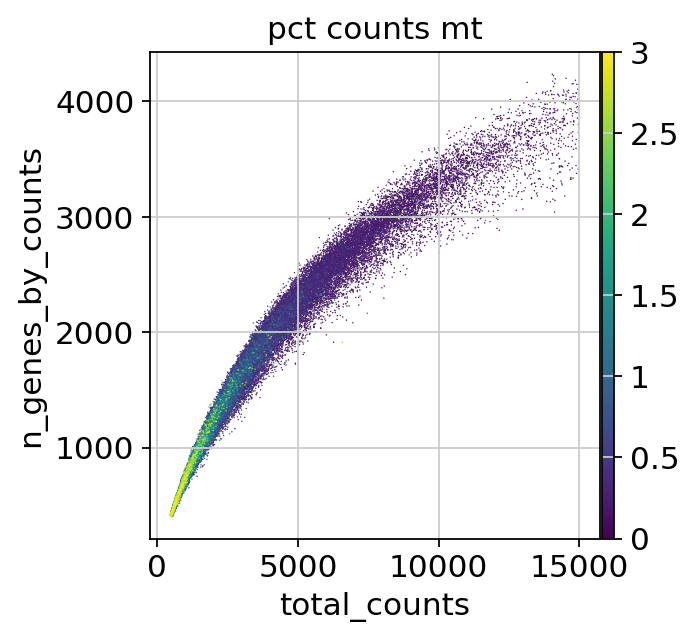

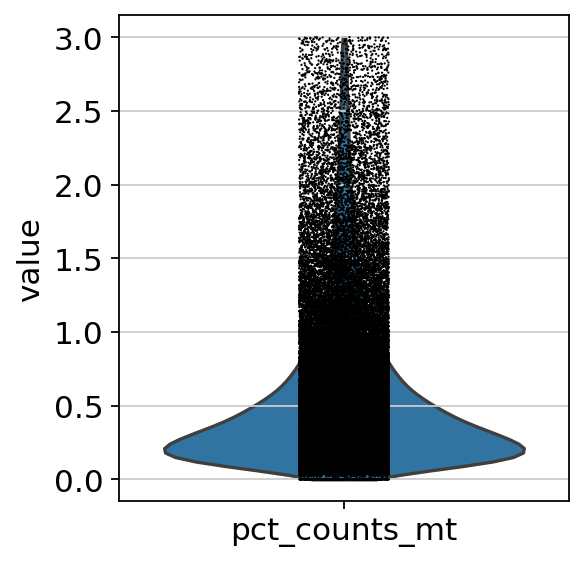

In [29]:
print(adata.obs.doublet.value_counts())
print(adata.obs.outlier.value_counts())
print(adata.obs.mt_outlier.value_counts())
print(f"Total number of cells: {adata.n_obs}")
adata = adata[(~adata.obs.doublet) & (~adata.obs.outlier) & (~adata.obs.mt_outlier)].copy()

print(f"Total number of genes: {adata.n_vars}")
# Min 1 cells - filters out 0 count genes
sc.pp.filter_genes(adata, min_cells=3)
print(f"Number of genes after cell filter: {adata.n_vars}")

## Filter cells
print(f"Total number of cells: {adata.n_obs}")
sc.pp.filter_cells(adata, min_genes = 100)
print(f"Number of cells after gene filter: {adata.n_obs}")

print(f"Number of cells after filtering of low quality cells: {adata.n_obs}")
p1 = sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")
p2 = sc.pl.violin(adata, "pct_counts_mt")

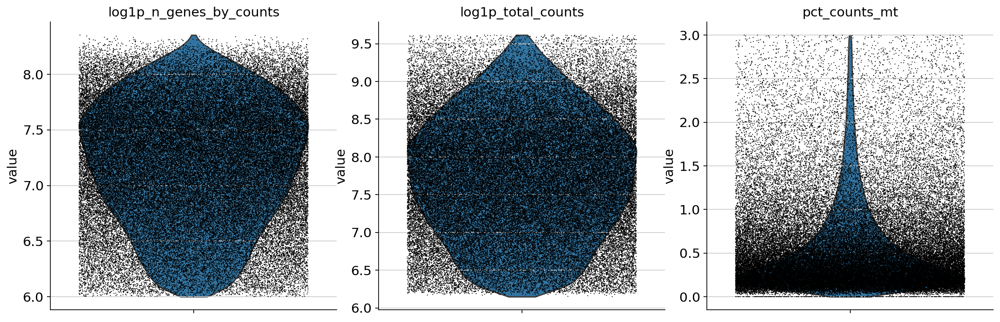

In [30]:
sc.pl.violin(adata, ['log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

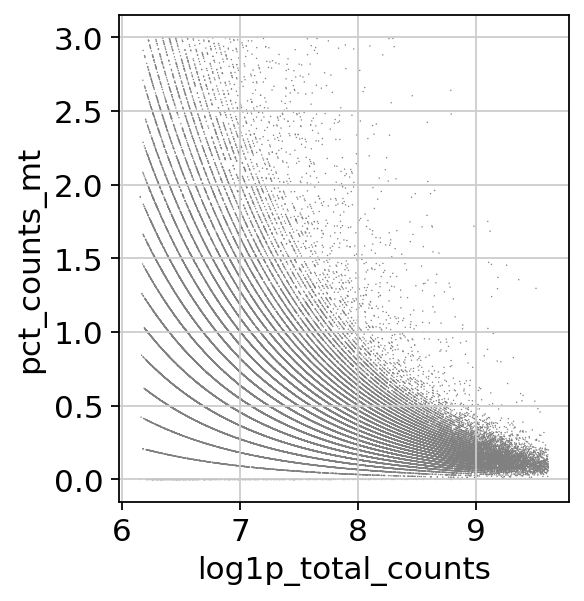

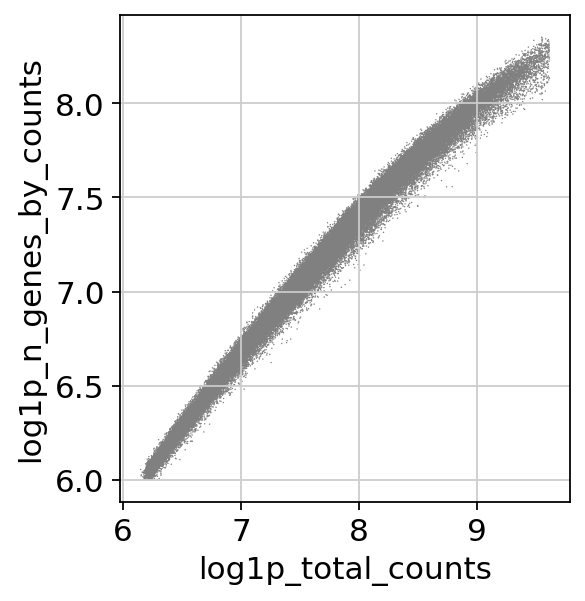

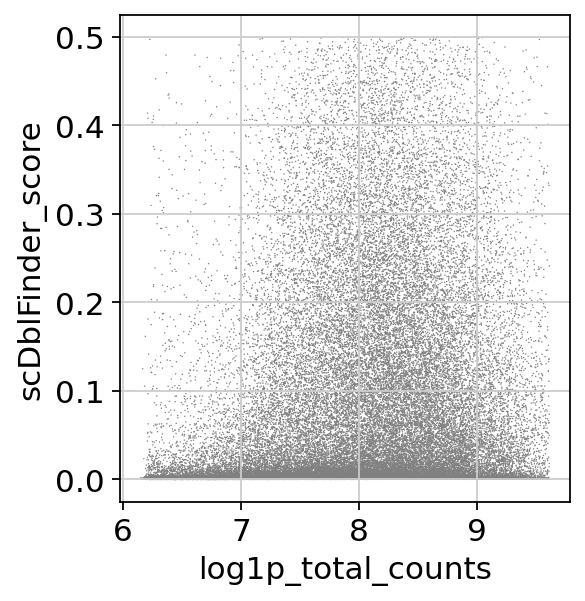

In [31]:
sc.pl.scatter(adata, x='log1p_total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='log1p_total_counts', y='log1p_n_genes_by_counts')
sc.pl.scatter(adata, x='log1p_total_counts', y='scDblFinder_score')

In [32]:
#Storing un-normalized data for scvi to use
adata.layers['counts'] = adata.X.copy()
adata.layers['counts']

<71813x20743 sparse matrix of type '<class 'numpy.float64'>'
	with 109876736 stored elements in Compressed Sparse Row format>

In [33]:
### Save preprocessed adata
adata.write_h5ad('../data/taPVAT_8W_24W_M_F_HF_CTRL_combined_preprocessed.h5ad')

In [34]:
adata = sc.read_h5ad('../data/taPVAT_8W_24W_M_F_HF_CTRL_combined_preprocessed.h5ad')

In [35]:
adata

AnnData object with n_obs × n_vars = 71813 × 20743
    obs: 'sample_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'n_genes', 'scDblFinder_score', 'scDblFinder_class', 'Sample', 'tissue', 'diet', 'time', 'sex', 'batch', 'sample_type', 'rat_id', 'weight_3W', 'weight_10W', 'weight_17W', 'weight_24W', 'MAP_7W', 'systolic_bp_7W', 'MAP_9W', 'systolic_bp_9W', 'MAP_16W', 'systolic_bp_16W', 'MAP_24W', 'systolic_bp_24W', 'doublet'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    layers: 'counts', 'raw_counts', 'soupX_counts'

In [36]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata

In [37]:
sc.pp.highly_variable_genes(adata, n_top_genes = 2000, subset = True, layer = 'counts',
                            flavor = 'seurat_v3', batch_key = 'Sample', span = 0.5)

In [38]:
adata.var

,gene_ids,mt,ribo,hb,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,n_cells,highly_variable,highly_variable_rank,means,variances,variances_norm,highly_variable_nbatches
6330411D24Rik,ENSRNOG00000065736,False,False,False,288,0.005936,0.005919,99.644563,481.0,6.177944,254,True,471.5,0.005793,0.015925,1.532331,10
AABR07013165.1,ENSRNOG00000060844,False,False,False,1607,0.022277,0.022032,98.016710,1805.0,7.498870,1347,True,996.0,0.020818,0.025231,0.962815,1
AABR07028615.1,ENSRNOG00000018500,False,False,False,11467,0.352413,0.301891,85.847927,28555.0,10.259622,10398,True,395.0,0.348711,1.614822,2.310276,24
AABR07031491.2,ENSRNOG00000049681,False,False,False,9282,0.159441,0.147938,88.544559,12919.0,9.466532,8141,True,556.0,0.155153,0.292587,1.262159,7
AABR07032097.1,ENSRNOG00000019744,False,False,False,2015,0.054661,0.053219,97.513175,4429.0,8.396155,1835,True,365.0,0.055965,0.226565,2.532801,25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zmat4,ENSRNOG00000042690,False,False,False,274,0.005430,0.005416,99.661841,440.0,6.089045,227,True,797.5,0.005124,0.014957,1.407494,14
Zmym1,ENSRNOG00000013855,False,False,False,10945,0.170215,0.157187,86.492157,13792.0,9.531916,9250,True,307.0,0.159233,0.208630,0.885316,1
Zmym3,ENSRNOG00000003707,False,False,False,6708,0.093524,0.089406,91.721278,7578.0,8.933137,5711,True,702.0,0.089482,0.104175,0.845342,1
Zmynd15,ENSRNOG00000019477,False,False,False,118,0.001530,0.001529,99.854370,124.0,4.828314,106,True,879.0,0.001546,0.001710,0.887038,1


## Running scvi for batch integration

In [39]:
scvi.settings.seed = 0
print("Last run with scvi-tools version:", scvi.__version__)

[rank: 0] Global seed set to 0


Last run with scvi-tools version: 1.0.4


In [40]:
scvi.model.SCVI.setup_anndata(
    adata,
    layer="counts",
    categorical_covariate_keys=["Sample"],
    continuous_covariate_keys=["pct_counts_mt", "pct_counts_ribo", "total_counts"]
)

No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


In [41]:
model = scvi.model.SCVI(adata, n_layers=2, n_latent=30, gene_likelihood="nb")

In [42]:
model.train()

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 111/111: 100%|██████████| 111/111 [06:44<00:00,  3.68s/it, v_num=1, train_loss_step=509, train_loss_epoch=481]

`Trainer.fit` stopped: `max_epochs=111` reached.


Epoch 111/111: 100%|██████████| 111/111 [06:44<00:00,  3.64s/it, v_num=1, train_loss_step=509, train_loss_epoch=481]


In [43]:
#####Saving the model
#model.save('./models/taPVAT_8W_24W_M_F_HF_CTRL_combined_model_v1')
#####Reloading the model:
model = scvi.model.SCVI.load('./models/taPVAT_8W_24W_M_F_HF_CTRL_combined_model_v1',  adata=adata, use_gpu=True)

In [44]:
latent = model.get_latent_representation()
latent.shape

(71813, 30)

In [45]:
adata.obsm["X_scVI"] = latent
adata.layers["scvi_normalized"] = model.get_normalized_expression(library_size=1e4)

## Labeleing clusters (approximately) for scANVI use

In [46]:
sc.pp.neighbors(adata, use_rep="X_scVI", random_state = 0)
sc.tl.umap(adata, min_dist = 0.2)

/mnt/home/terrianl/anaconda3/envs/scanpyEnv/lib/python3.11/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/mnt/home/terrianl/anaconda3/envs/scanpyEnv/lib/python3.11/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/mnt/home/terrianl/anaconda3/envs/scanpyEnv/lib/pyth

In [47]:
sc.tl.leiden(adata, resolution = 2)

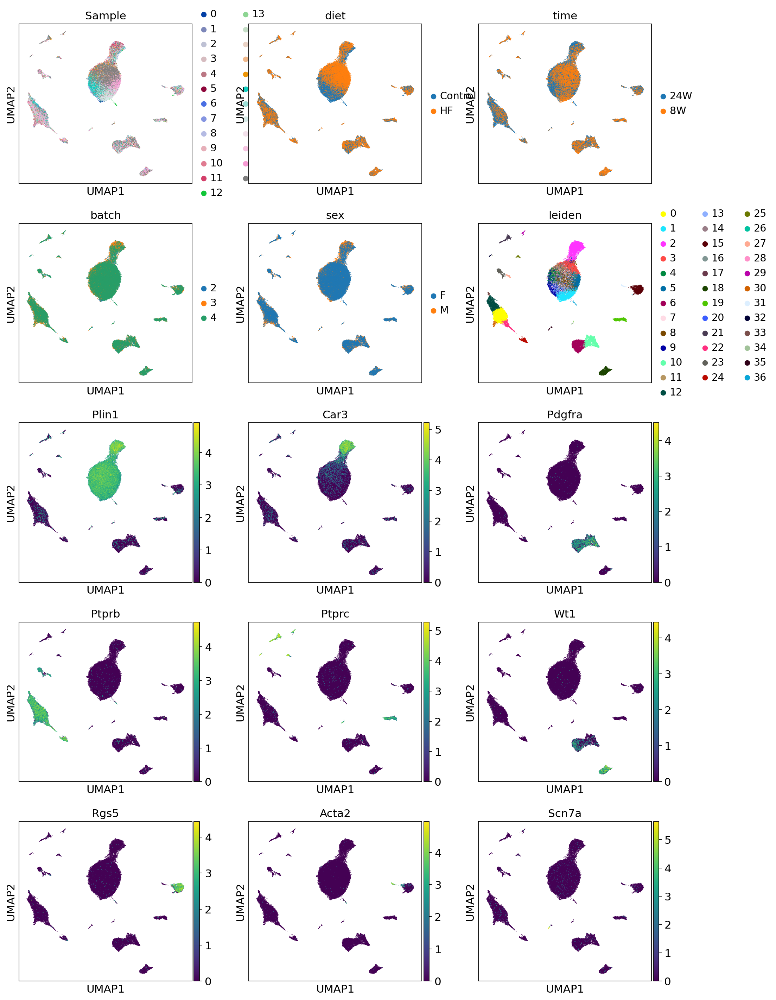

In [48]:
### Checking scVI batch integration effectiveness and location of marker gene expression
sc.pl.umap(adata, color = ["Sample", "diet", "time", "batch", "sex", "leiden", 
                           "Plin1", "Car3", "Pdgfra", "Ptprb", "Ptprc", "Wt1", "Rgs5", "Acta2", "Scn7a"], ncols = 3)

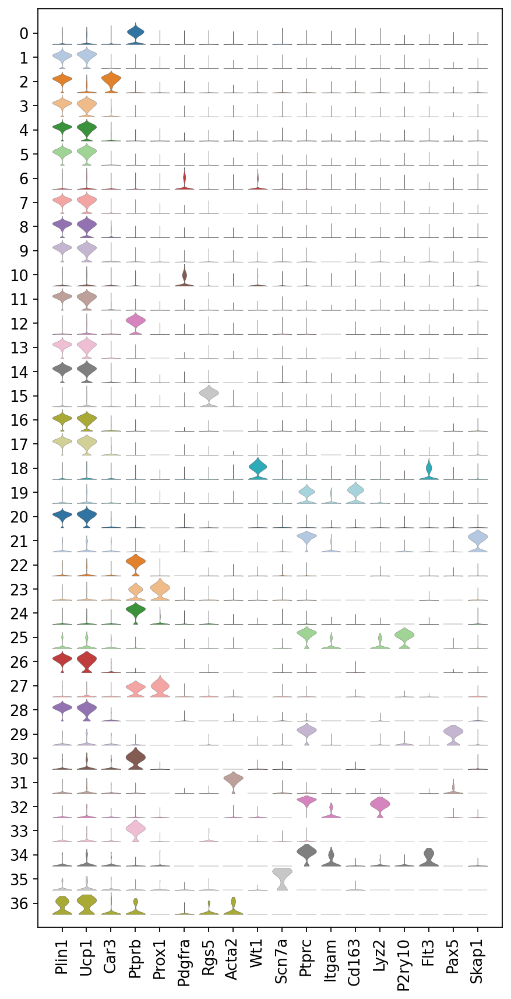

In [56]:
### Stacked violin plot of marker gene expression
### Marker genes taken from literature and previous cell atlas work
mgl = ["Plin1",             #Adipocytes
       "Ucp1",              #Adipocytes_Brown
       "Car3",              #Adipocytes_2
       'Ptprb',             #Endothelial_Cells
       "Prox1",             #Endothelial Cells_Lymphatic 
       "Pdgfra",            #Fibroblasts
       "Rgs5",              #Pericytes
       'Acta2',             #Smooth_Muscle_Cells
       "Wt1",               #Mesothelial Cells
       'Scn7a',             #Neuronal_cells
       "Ptprc",             #Immune_Cells  
       "Itgam",             #Myeloid_Cells
       "Cd163",             #Macrophages_M2
       "Lyz2",              #Macrophages_M1
       "P2ry10",            #Myeloid_Cells (Unknown)
       "Flt3",              #Dendritic_Cells
       "Pax5",              #B_Cells    
       "Skap1"              #T_Cells
]

ax = sc.pl.stacked_violin(adata, 
                          mgl, 
                          use_raw = True,
                          groupby='leiden', 
                          swap_axes = False,
                          row_palette = 'tab20')

In [57]:
### Best estimate of cell types from inital analysis for use with scANVI
def cell_type_mapping(x):
    cell_type_dict = {
        '0': "ECs",
        '1': "Adipocytes_Brown",
        '2': "Adipocytes_2",
        '3': "Adipocytes_Brown",
        '4': "Adipocytes_Brown",
        '5': "Adipocytes_Brown",
        '6': 'Fibroblasts',
        '7': "Adipocytes_Brown",
        '8': "Adipocytes_Brown",
        '9': "Adipocytes_Brown",
        '10': "Fibroblasts",
        '11': "Adipocytes_Brown",
        '12': "ECs",
        '13': "Adipocytes_Brown",
        '14': "Adipocytes_Brown",
        '15': "Pericytes",
        '16': "Adipocytes_Brown",
        '17': 'Adipocytes_Brown',
        '18': 'Mesothelial_Cells',
        '19': 'Myeloid_Cells',
        '20': 'Adipocytes_Brown',
        '21': 'T_Cells',
        '22': 'ECs',
        '23': 'ECs_Lymph',
        '24': 'ECs',
        '25': 'Myeloid_Cells',
        '26': 'Adipocytes_Brown',
        '27': 'ECs_Lymph',
        '28': 'Adipocytes_Brown',
        '29': 'B_Cells',
        '30': 'ECs',
        '31': 'SMCs',
        '32': 'Myeloid_Cells',
        '33': 'ECs',
        '34': 'Myeloid_Cells',
        '35': 'Neuronal_Cells',
        '36': 'Adipocytes_Brown'
    }

    return cell_type_dict.get(str(x), 'Unknown_Cell_Type')

adata.obs['celltype'] = adata.obs.leiden.map(cell_type_mapping)
print(adata.obs['celltype'].value_counts())

Adipocytes_Brown     40933
ECs                  10381
Fibroblasts           6686
Adipocytes_2          5142
Pericytes             2400
Myeloid_Cells         2063
Mesothelial_Cells     1547
ECs_Lymph             1101
T_Cells                989
B_Cells                281
SMCs                   183
Neuronal_Cells         107
Name: celltype, dtype: int64


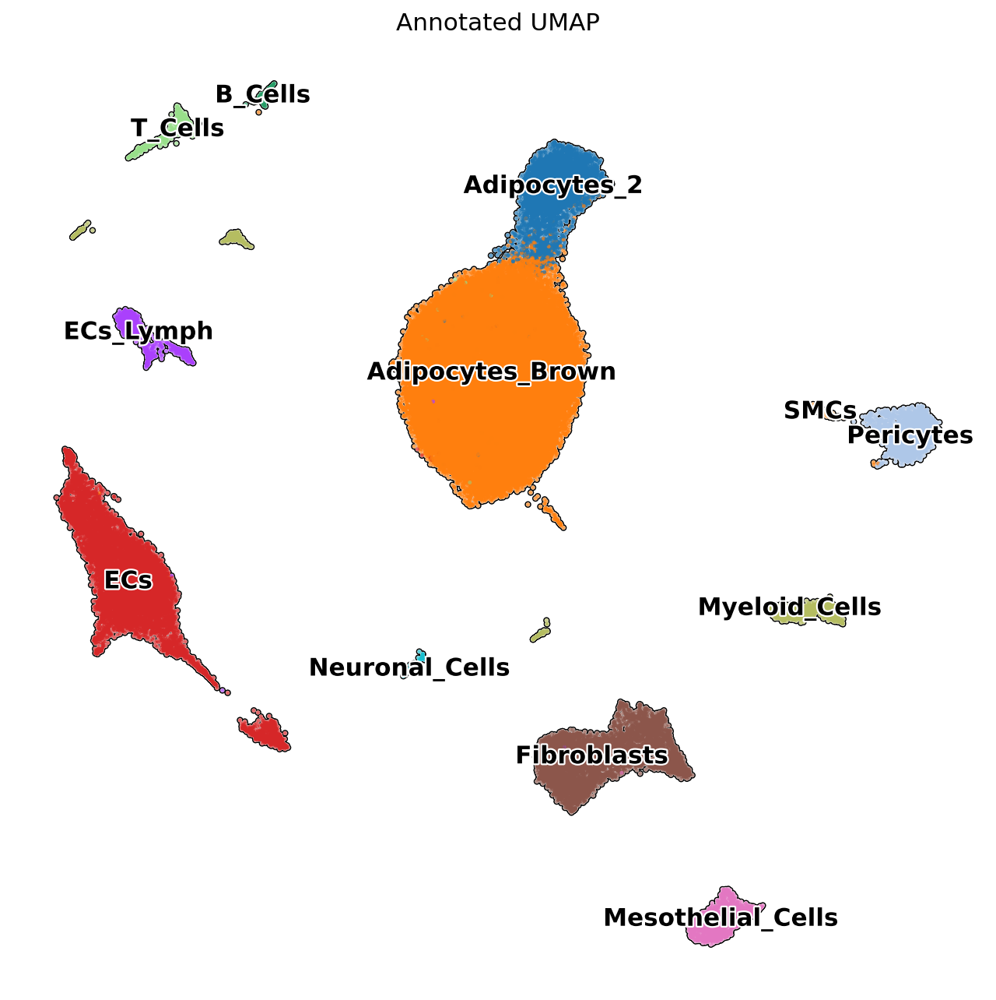

In [58]:
###Plotting single graph of all cells
fig, ax = plt.subplots(figsize = (10,10))
sc.pl.umap(adata, ax = ax, color='celltype', add_outline=True, size = 20, 
        legend_loc='on data', legend_fontsize=14, legend_fontoutline=2,frameon=False,
        title='Annotated UMAP')
plt.show()

## Running scANVI on labeled data for better batch integration

In [59]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(
    model,
    adata=adata,
    labels_key="celltype",
    unlabeled_category="Unknown"
)

In [60]:
scanvi_model.train(max_epochs=40, n_samples_per_label=100)

INFO     Training for 40 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 40/40: 100%|██████████| 40/40 [05:47<00:00,  8.66s/it, v_num=1, train_loss_step=558, train_loss_epoch=545]

`Trainer.fit` stopped: `max_epochs=40` reached.


Epoch 40/40: 100%|██████████| 40/40 [05:47<00:00,  8.69s/it, v_num=1, train_loss_step=558, train_loss_epoch=545]


In [61]:
SCANVI_LATENT_KEY = "X_scANVI"
adata.obsm[SCANVI_LATENT_KEY] = scanvi_model.get_latent_representation(adata)

In [62]:
sc.pp.neighbors(adata, use_rep="X_scANVI", random_state = 0)
sc.tl.umap(adata, min_dist = 0.2)

In [63]:
sc.tl.leiden(adata, resolution = 0.5)

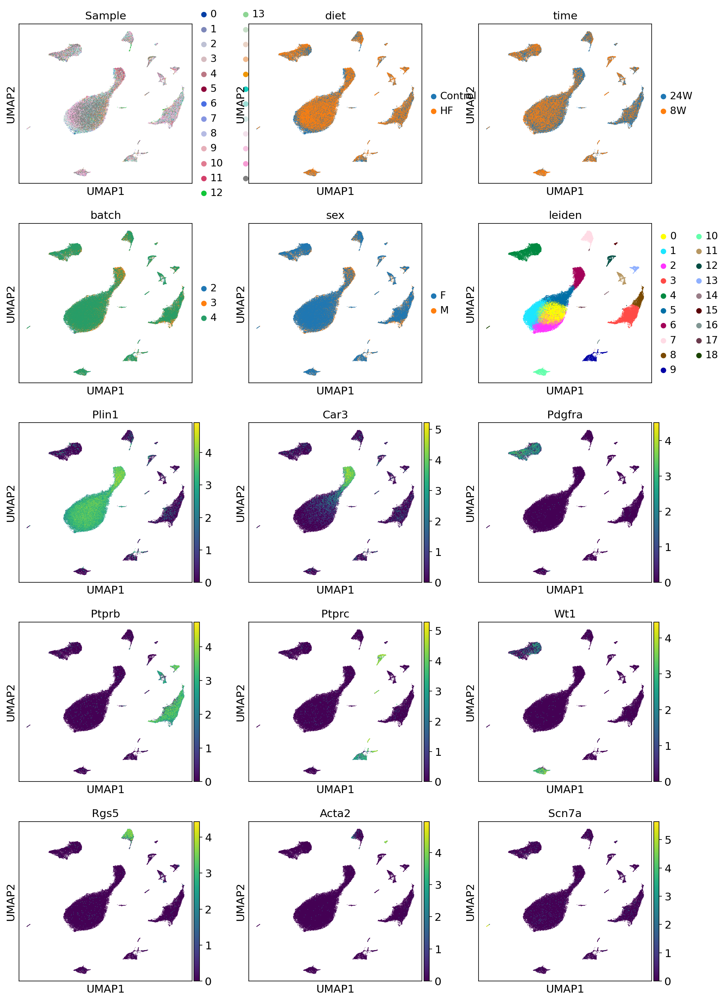

In [64]:
### Checking scANVI batch integration effectiveness and location of marker gene expression
sc.pl.umap(adata, color = ["Sample", "diet", "time", "batch", "sex", "leiden", 
                           "Plin1", "Car3", "Pdgfra", "Ptprb", "Ptprc", "Wt1", "Rgs5", "Acta2", "Scn7a"], ncols = 3)

## Visualizations: Dimensionality Reduction and Clustering

### Before batch integration

In [58]:
### Without batch correction
# sc.tl.pca(adata)
# sc.pp.neighbors(adata)

In [59]:
# sc.tl.umap(adata, min_dist = 0.2)
# sc.tl.leiden(adata, resolution = 0.5)

In [60]:
# fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (16,8))
# sc.pl.pca(adata, color = "sample_id", ax = ax[0], show = False)
# sc.pl.umap(adata, color = "sample_id", ax = ax[1], show = False)
# plt.show()

### After batch integration

<Axes: title={'center': 'random_state_5'}, xlabel='UMAP1', ylabel='UMAP2'>

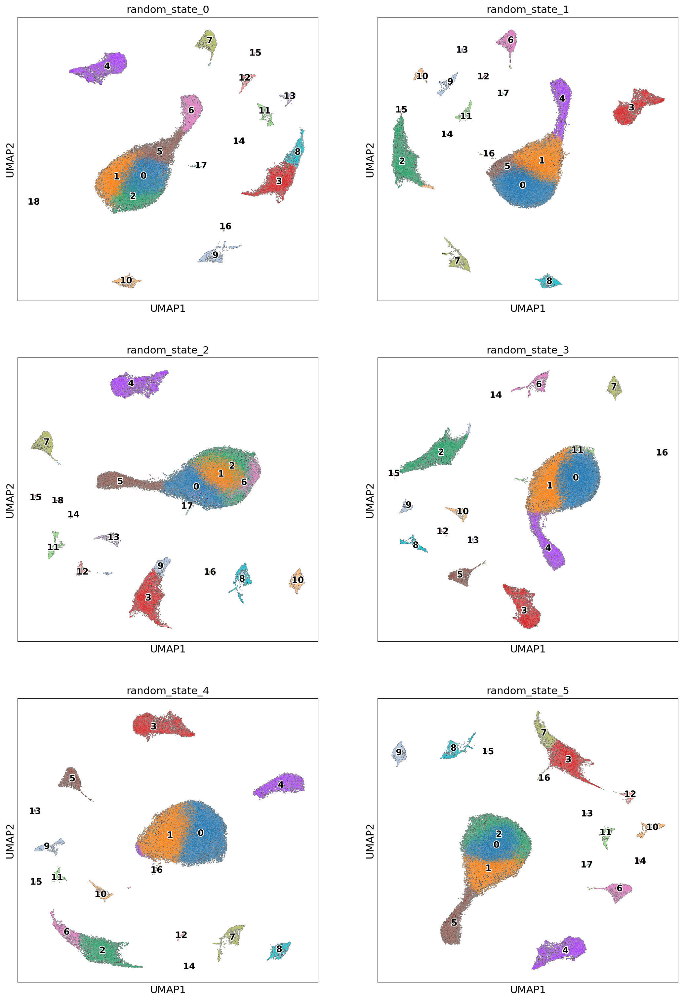

In [65]:
### With batch correction

# def calc_umap(random_state = 0, row = 0, col = 0):
#     sc.pp.neighbors(adata, use_rep="X_scANVI", random_state = random_state)
#     sc.tl.umap(adata, min_dist = 0.2)
#     sc.tl.leiden(adata, use_weights= True, resolution = 0.5, key_added = 'random_state_' + str(random_state))
#     umap = sc.pl.umap(adata, ax = ax[row,col], color=['random_state_' + str(random_state)], 
#                       add_outline=True, legend_loc='on data', legend_fontsize=12, 
#                       legend_fontoutline=2, frameon=True, show = False)
#     return umap
    
# fig, ax = plt.subplots(nrows = 3, ncols = 2, figsize = (16,24))

# calc_umap(0,0,0)
# calc_umap(1,0,1)
# calc_umap(2,1,0)
# calc_umap(3,1,1)
# calc_umap(4,2,0)
# calc_umap(5,2,1)

In [66]:
### Choose the random state with the best representation 
sc.pp.neighbors(adata, use_rep="X_scANVI", random_state = 5)
sc.tl.umap(adata, min_dist = 0.2)

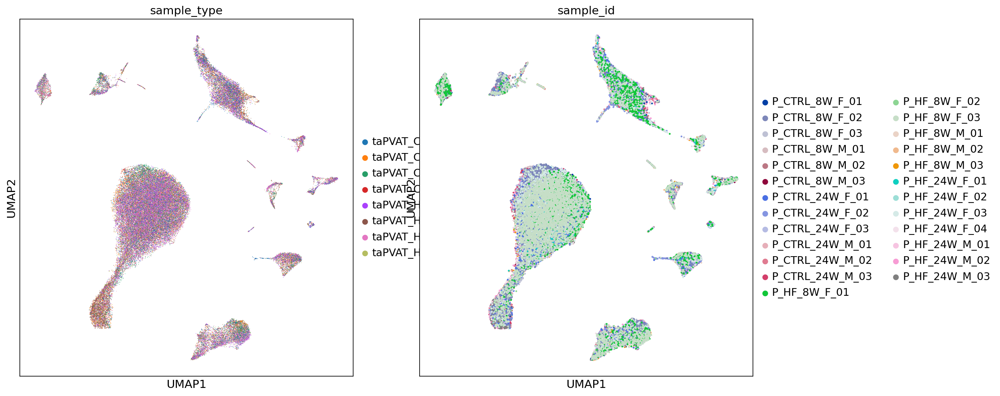

In [75]:
### Plot samples after batch integration
fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (16,8))
sc.pl.umap(adata, color = "sample_type", ax = ax[0], show = False)
sc.pl.umap(adata, color = "sample_id", ax = ax[1], vmax = 0.1, size = 20, show = False)
plt.show()

<Axes: title={'center': 'leiden2.0'}, xlabel='UMAP1', ylabel='UMAP2'>

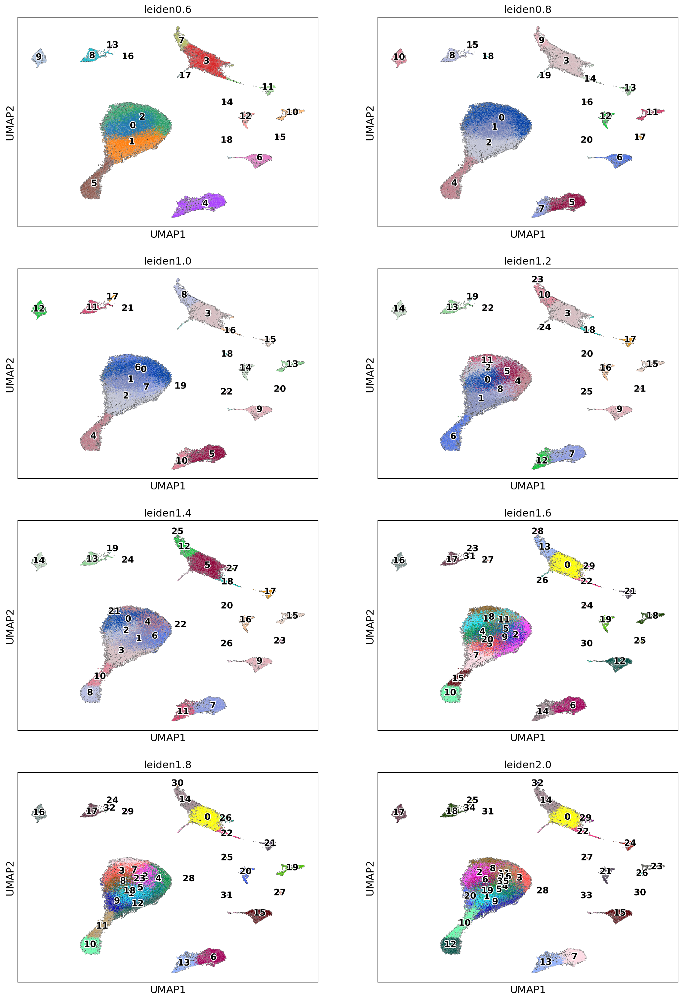

In [68]:
### Plot leiden clusters on the umap using multiple resolutions so the best fit can be picked
# def plot_leiden_umap(resolution = 1, row = 0, col = 0):
#     sc.tl.leiden(adata, use_weights= True, resolution = resolution, key_added = 'leiden' + str(resolution))
#     umap = sc.pl.umap(adata, ax = ax[row,col], color=['leiden' + str(resolution)], add_outline=True, legend_loc='on data',
#                    legend_fontsize=12, legend_fontoutline=2,frameon=True, show = False)
#     return umap
    
# fig, ax = plt.subplots(nrows = 4, ncols = 2, figsize = (16,24))

# plot_leiden_umap(0.6,0,0)
# plot_leiden_umap(0.8,0,1)
# plot_leiden_umap(1.0,1,0)
# plot_leiden_umap(1.2,1,1)
# plot_leiden_umap(1.4,2,0)
# plot_leiden_umap(1.6,2,1)
# plot_leiden_umap(1.8,3,0)
# plot_leiden_umap(2.0,3,1)

In [74]:
#Choose the best fit leiden cluster resolution
best_resolution = 1.6
sc.tl.leiden(adata, use_weights = True, resolution = best_resolution)

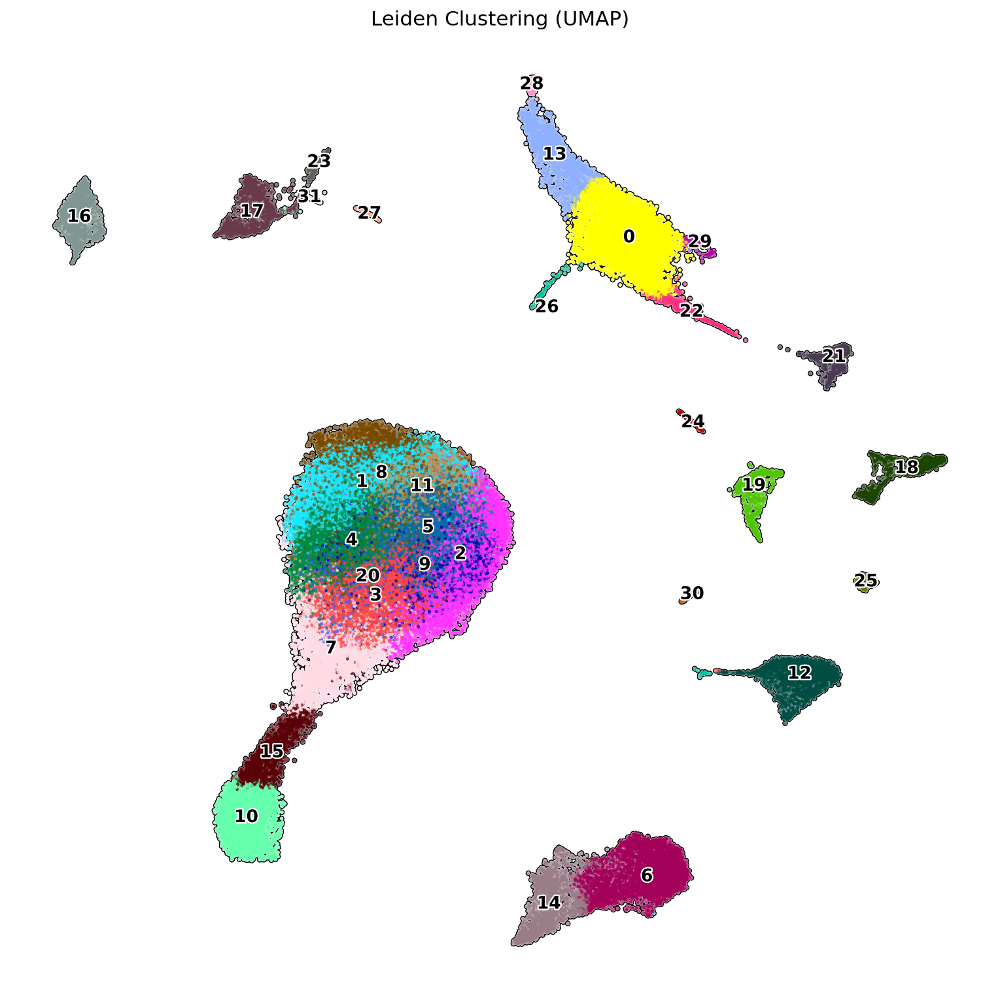

In [76]:
### Plot a large UMAP
fig, ax = plt.subplots(ncols = 1, figsize = (12,12))
sc.pl.umap(adata, ax = ax, color='leiden', add_outline=True, legend_loc='on data',
           legend_fontsize=12, legend_fontoutline=2,frameon=False, size = 20,
           title = 'Leiden Clustering (UMAP)')

### Running PAGA and getting a force directed graph representation

In [78]:
sc.tl.diffmap(adata)
# Calculate neighbors again based on diffusionmap 
sc.pp.neighbors(adata, n_neighbors=10, use_rep='X_diffmap')

In [79]:
# PAGA graph construction
sc.tl.paga(adata, groups='leiden')

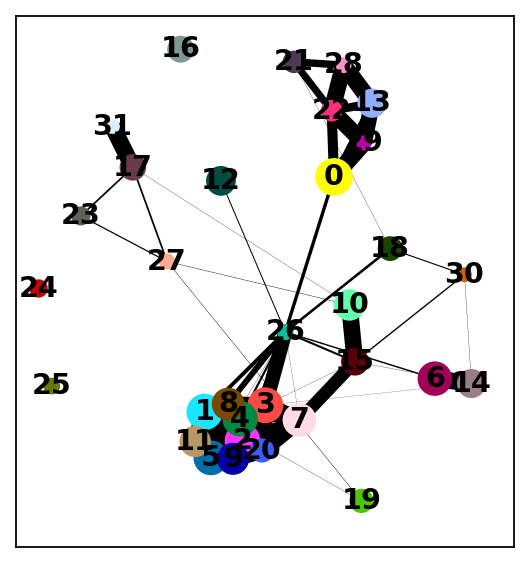

In [80]:
sc.pl.paga(adata)

In [81]:
sc.tl.draw_graph(adata, init_pos='paga', random_state=123)

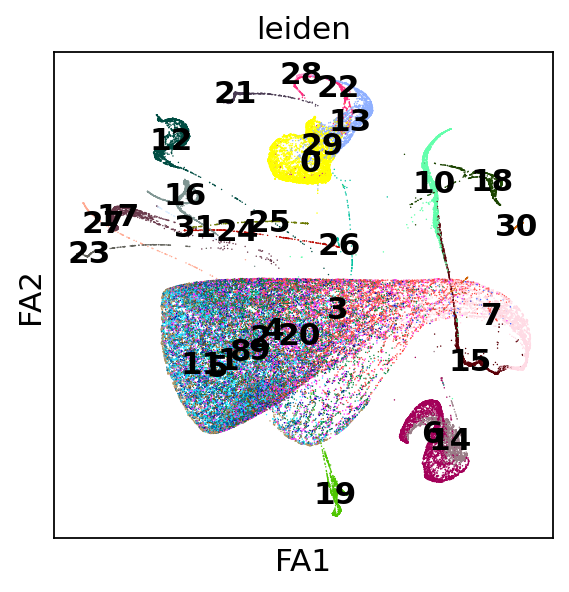

In [82]:
sc.pl.draw_graph(adata, color='leiden', legend_loc='on data')

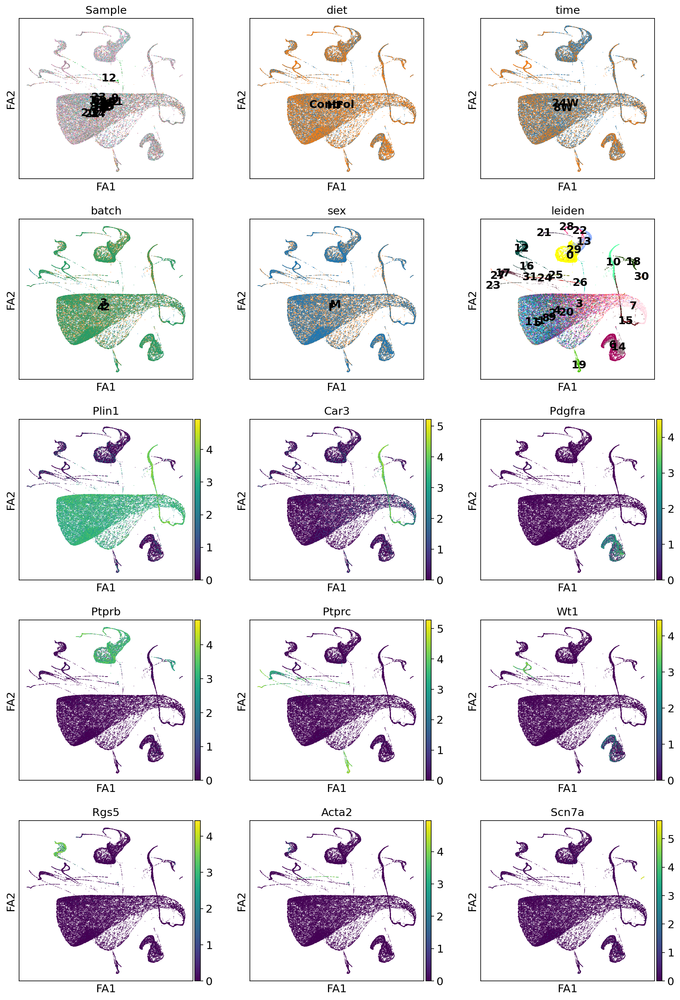

In [83]:
sc.pl.draw_graph(adata, 
                 color = ["Sample", "diet", "time", "batch", "sex", "leiden", 
                          "Plin1", "Car3", "Pdgfra", "Ptprb", "Ptprc", "Wt1", "Rgs5", "Acta2", "Scn7a"], 
                 legend_loc='on data', ncols = 3)

In [84]:
### Save adata
adata.write_h5ad('../data/taPVAT_8W_24W_M_F_HF_CTRL_combined_scANVI.h5ad')